In [1]:
import os
import cv2
import random
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt

In [2]:
# def apply_ben_graham(img, target_size=224):
#     """Corectează iluminarea și scoate în evidență leziunile."""
#     img = cv2.resize(img, (target_size, target_size))
#     blur = cv2.GaussianBlur(img, (0, 0), sigmaX=10)
#     img_processed = cv2.addWeighted(img, 4, blur, -4, 128)
#     return img_processed

def augment_image(img):
    """
    Lista de augmentări: Rotiri multiple și Flip-uri.
    Aplicăm transformări geometrice aleatorii pentru imaginile supra-eșantionate.
    """
    # 1. Flip Orizontal (50% șanse)
    if random.random() > 0.5:
        img = cv2.flip(img, 1)
        
    # 2. Flip Vertical (50% șanse)
    if random.random() > 0.5:
        img = cv2.flip(img, 0)
        
    # 3. Rotație (Alegem un unghi sigur pentru a păstra imaginea pătrată și pixelii intacți)
    angle = random.choice([0, 90, 180, 270])
    if angle == 90:
        img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
    elif angle == 180:
        img = cv2.rotate(img, cv2.ROTATE_180)
    elif angle == 270:
        img = cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)
        
    return img

def get_real_image_path(base_dir, img_name_from_csv):
    """
    Caută fizic pe disc fișierul, indiferent de ce extensie are sau îi lipsește în CSV.
    """
    nume_baza = os.path.splitext(img_name_from_csv)[0] 
    extensii_posibile = ['.jpg', '.jpeg', '.png', '.JPG', '.JPEG', '.PNG']
    
    for ext in extensii_posibile:
        cale_test = os.path.join(base_dir, nume_baza + ext)
        if os.path.exists(cale_test):
            return cale_test
            
    return None


In [3]:
# Delete all files and folders in dataset_augmented directory
import shutil


def clear_output_directory(output_dir):
    if os.path.exists(output_dir):
        for filename in os.listdir(output_dir):
            file_path = os.path.join(output_dir, filename)
            if os.path.isfile(file_path):
                os.remove(file_path)
            elif os.path.isdir(file_path):
                shutil.rmtree(file_path)
    else:
        os.makedirs(output_dir)

In [4]:
def main():
    # Calea principală a proiectului
    root_dir = r'B:\Projects\Disertatie\Diabetic-Retinopathy-Classifier'
    output_dir = os.path.join(root_dir, 'datasets_augmented')
    image_size = 224 # Menținem mărimea standard pentru ResNet / EfficientNet
    
    # Configurația exactă furnizată
    datasets_config = {
        'aptos': {
            'train': {'csv': 'datasets/aptos2019/versions/3/train_1.csv', 
                      'img': 'datasets/aptos2019/versions/3/train_images/train_images'},
            'test':  {'csv': 'datasets/aptos2019/versions/3/test.csv',  
                      'img': 'datasets/aptos2019/versions/3/test_images/test_images'}
        },
        'eyepacs': {
            'train': {'csv': 'datasets/resized-2015-2019-diabetic-retinopathy-detection/versions/4/labels/trainLabels15.csv', 
                      'img': 'datasets/resized-2015-2019-diabetic-retinopathy-detection/versions/4/resized_traintest15_train19'},
            # Folderul de test EyePACS corectat
            'test':  {'csv': 'datasets/resized-2015-2019-diabetic-retinopathy-detection/versions/4/labels/testLabels15.csv',  
                      'img': 'datasets/resized-2015-2019-diabetic-retinopathy-detection/versions/4/resized_traintest15_train19'}
        },
        'idrid': {
            'train': {'csv': 'datasets/idrid-dataset/versions/1/idrid_labels.csv', 
                      'img': 'datasets/idrid-dataset/versions/1/Imagenes/Imagenes'},
            'test':  {'csv': 'datasets/idrid-dataset/versions/1/idrid_labels.csv', 
                      'img': 'datasets/idrid-dataset/versions/1/Imagenes/Imagenes'}
        },
        'messidor2': {
            'train': {'csv': 'datasets/messidor2preprocess/versions/2/messidor_data.csv', 
                      'img': 'datasets/messidor2preprocess/versions/2/messidor-2/messidor-2/preprocess'},
            'test':  {'csv': 'datasets/messidor2preprocess/versions/2/messidor_data.csv', 
                      'img': 'datasets/messidor2preprocess/versions/2/messidor-2/messidor-2/preprocess'} 
        }
    }

    print("🚀 Începem augmentarea și balansarea dataset-urilor (FĂRĂ Ben Graham)...\n")

    for dataset_name, splits in datasets_config.items():
        print(f"=========================================")
        print(f" Procesare Dataset: {dataset_name.upper()}")
        print(f"=========================================")
        
        for split_name, config in splits.items():
            csv_path = os.path.join(root_dir, config['csv'])
            img_in_dir = os.path.join(root_dir, config['img'])
            
            try:
                df = pd.read_csv(csv_path)
            except FileNotFoundError:
                print(f"[Eroare] Nu am găsit {csv_path}. Sărim peste.")
                continue
            
            # Preluăm etichetele și calculăm distribuția
            counts = df.iloc[:, 1].value_counts().to_dict()
            
            # Creăm folderele de ieșire
            save_path = os.path.join(output_dir, dataset_name, split_name, 'images')
            os.makedirs(save_path, exist_ok=True)
            
            new_data = [] 
            
            # Setăm ținta de balansare
            if split_name == 'train':
                max_samples = max(counts.values()) # Ținta este clasa majoritară
                print(f"[{split_name.upper()}] Balansăm toate clasele la {max_samples} imagini.")
            else:
                max_samples = 0 
                print(f"[{split_name.upper()}] Doar redimensionăm imaginile la {image_size}x{image_size} (păstrăm distribuția originală).")

            # Procesăm fiecare stadiu (0, 1, 2, 3, 4)
            for class_id in range(5):
                class_df = df[df.iloc[:, 1] == class_id]
                if len(class_df) == 0:
                    continue
                
                # Câte imagini generăm pentru această clasă?
                num_to_generate = max_samples if split_name == 'train' else len(class_df)
                
                pbar = tqdm(total=num_to_generate, desc=f"  Clasa {class_id}", ncols=90)
                
                generated_count = 0
                original_images = class_df.values.tolist()
                
                while generated_count < num_to_generate:
                    # Folosim modulo pentru a avea o secvență stabilă (permite resume)
                    index_curent = generated_count % len(original_images)
                    row = original_images[index_curent]
                    is_original = (generated_count < len(original_images))
                        
                    orig_name = str(row[0])
                    nume_curat = os.path.splitext(orig_name)[0]
                    
                    # Nomenclatură clară: c[clasa]_[numar]_[numeOriginal].jpg
                    new_filename = f"c{class_id}_{generated_count:04d}_{nume_curat}.jpg"
                    output_path = os.path.join(save_path, new_filename)
                    
                    # LOGICĂ DE RESUME: Dacă fișierul există deja, sărim peste procesare
                    if os.path.exists(output_path):
                        new_data.append([new_filename, class_id])
                        generated_count += 1
                        pbar.update(1)
                        continue
                    
                    # Căutăm calea REALĂ pe disc
                    img_path = get_real_image_path(img_in_dir, orig_name)
                    
                    if img_path is None:
                        if is_original: generated_count += 1; pbar.update(1)
                        continue
                        
                    img = cv2.imread(img_path)
                    if img is None:
                        if is_original: generated_count += 1; pbar.update(1)
                        continue
                        
                    # 1. Redimensionăm simplu imaginea (fără modificări de culoare)
                    img_processed = cv2.resize(img, (image_size, image_size))
                    
                    # 2. Dacă generăm o imagine dublură pentru echilibrare, o augmentăm geometric
                    if not is_original:
                        img_processed = augment_image(img_processed)
                    
                    # 3. Salvăm și înregistrăm
                    cv2.imwrite(output_path, img_processed)
                    new_data.append([new_filename, class_id])
                    
                    generated_count += 1
                    pbar.update(1)
                    
                pbar.close()

            # --- SALVĂM NOUL CSV ---
            new_df = pd.DataFrame(new_data, columns=['id_code', 'diagnosis'])
            
            sufix = 'balanced' if split_name == 'train' else 'processed'
            nume_csv_nou = f"{dataset_name}_{split_name}_{sufix}.csv"
            cale_csv_nou = os.path.join(output_dir, dataset_name, split_name, nume_csv_nou)
            
            # Amestecăm doar train-ul pentru stabilitatea DataLoader-ului
            if split_name == 'train':
                new_df = new_df.sample(frac=1).reset_index(drop=True)
                
            new_df.to_csv(cale_csv_nou, index=False)
            
    print("\n✅ PROCESARE FINALIZATĂ! Ai un dataset balansat, augmentat geometric și cu culorile originale păstrate.")

if __name__ == '__main__':
    main()

🚀 Începem augmentarea și balansarea dataset-urilor (FĂRĂ Ben Graham)...

 Procesare Dataset: APTOS
[TRAIN] Balansăm toate clasele la 1434 imagini.


  Clasa 4: 100%|██████████████████████████████████████| 1434/1434 [01:35<00:00, 15.08it/s]


[TEST] Doar redimensionăm imaginile la 224x224 (păstrăm distribuția originală).


  Clasa 4: 100%|██████████████████████████████████████████| 33/33 [00:02<00:00, 15.26it/s]


 Procesare Dataset: EYEPACS
[TRAIN] Balansăm toate clasele la 25810 imagini.


  Clasa 4: 100%|███████████████████████████████████| 25810/25810 [02:03<00:00, 209.69it/s]


[TEST] Doar redimensionăm imaginile la 224x224 (păstrăm distribuția originală).


  Clasa 4: 100%|██████████████████████████████████████| 1206/1206 [00:16<00:00, 72.04it/s]


 Procesare Dataset: IDRID
[TRAIN] Balansăm toate clasele la 156 imagini.


  Clasa 4: 100%|████████████████████████████████████████| 156/156 [00:06<00:00, 25.10it/s]


[TEST] Doar redimensionăm imaginile la 224x224 (păstrăm distribuția originală).


  Clasa 4: 100%|██████████████████████████████████████████| 64/64 [00:02<00:00, 27.66it/s]


 Procesare Dataset: MESSIDOR2
[TRAIN] Balansăm toate clasele la 1017 imagini.


  Clasa 4: 100%|█████████████████████████████████████| 1017/1017 [00:04<00:00, 245.03it/s]


[TEST] Doar redimensionăm imaginile la 224x224 (păstrăm distribuția originală).


  Clasa 4: 100%|█████████████████████████████████████████| 35/35 [00:00<00:00, 235.03it/s]


✅ PROCESARE FINALIZATĂ! Ai un dataset balansat, augmentat geometric și cu culorile originale păstrate.


In [5]:
# show the number of images in each class for each dataset
root_dir = r'B:\Projects\Disertatie\Diabetic-Retinopathy-Classifier'
output_dir = os.path.join(root_dir, 'datasets_augmented')
for dataset_name in os.listdir(output_dir):
    print(f"Dataset: {dataset_name}")
    for split_name in ['train', 'test']:
        csv_path = os.path.join(output_dir, dataset_name, split_name, f"{dataset_name}_{split_name}_balanced.csv")
        # print(csv_path)
        if os.path.exists(csv_path):
            df = pd.read_csv(csv_path)
            counts = df['diagnosis'].value_counts().to_dict()
            print(f"  {split_name.capitalize()}: {counts}")
        else:
            print(f"  {split_name.capitalize()}: CSV not found!")


Dataset: aptos
  Train: {1: 1434, 0: 1434, 2: 1434, 3: 1434, 4: 1434}
  Test: CSV not found!
Dataset: eyepacs
  Train: {1: 25810, 3: 25810, 2: 25810, 4: 25810, 0: 25810}
  Test: CSV not found!
Dataset: idrid
  Train: {2: 156, 3: 156, 1: 156, 4: 156, 0: 156}
  Test: CSV not found!
Dataset: messidor2
  Train: {2: 1017, 0: 1017, 3: 1017, 1: 1017, 4: 1017}
  Test: CSV not found!


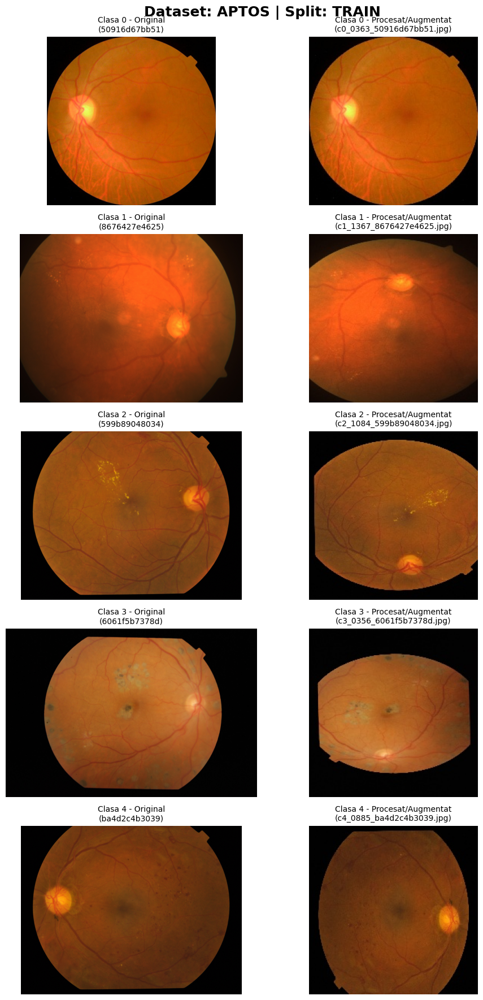

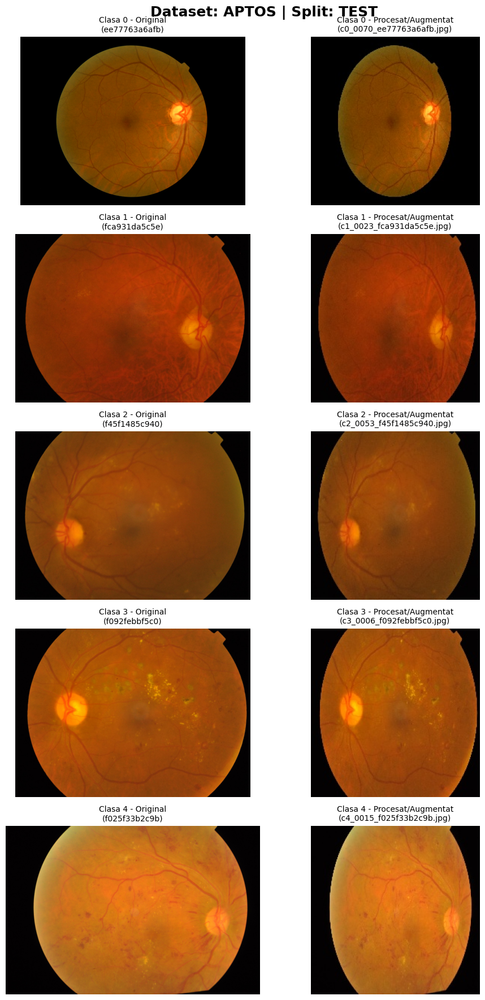

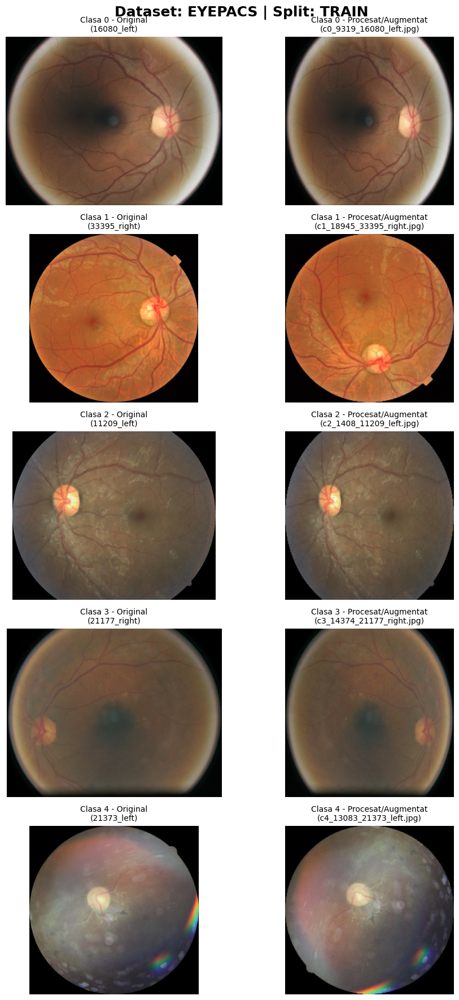

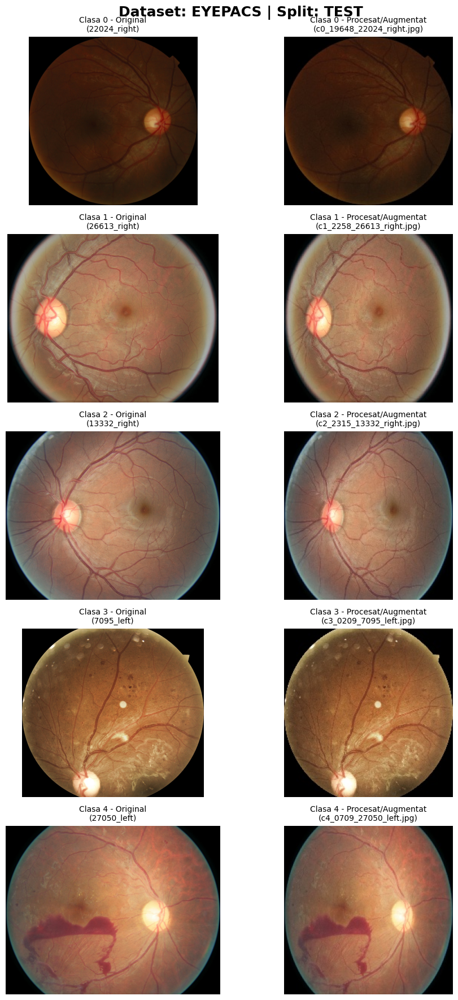

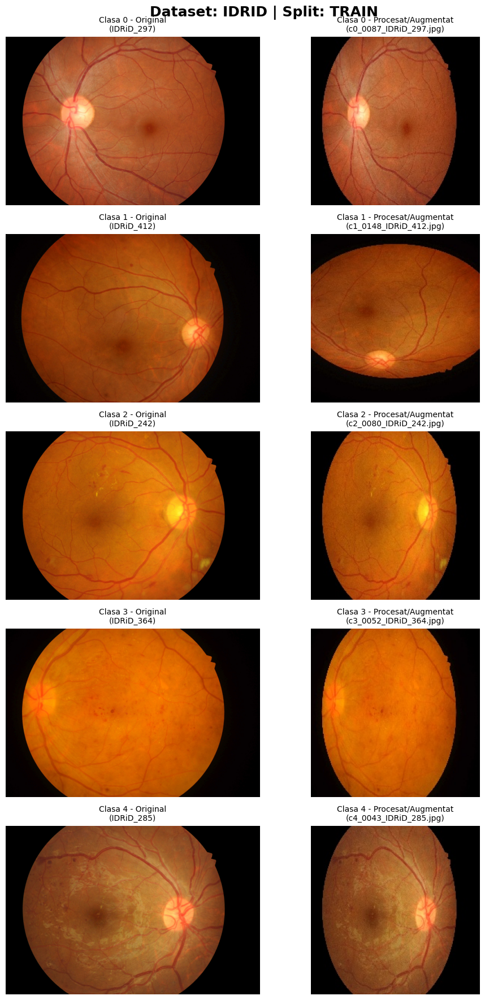

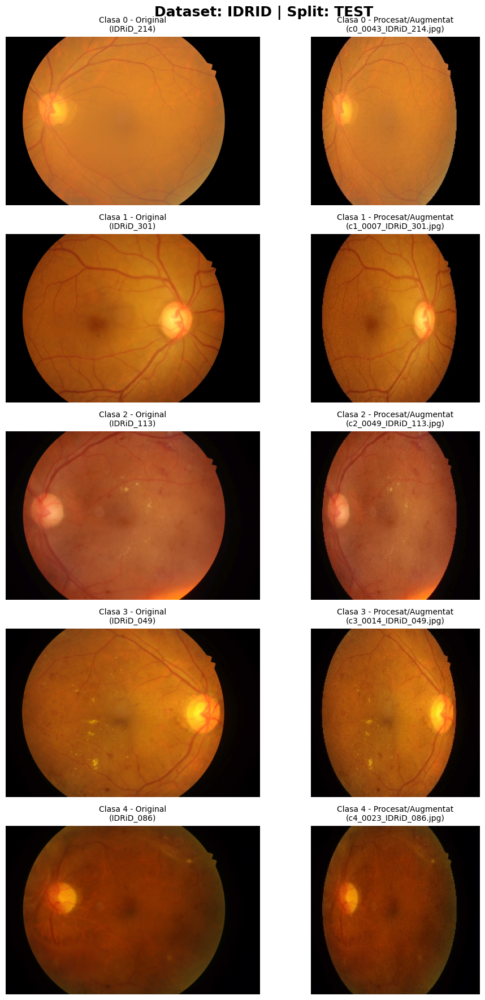

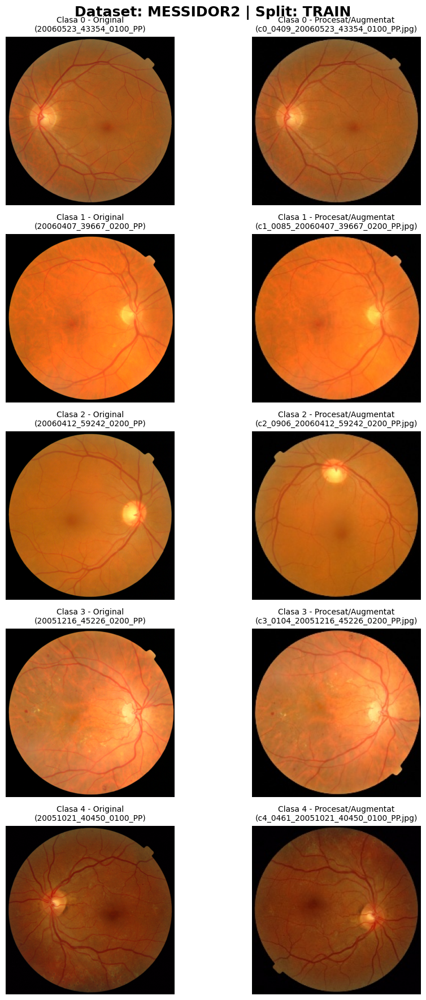

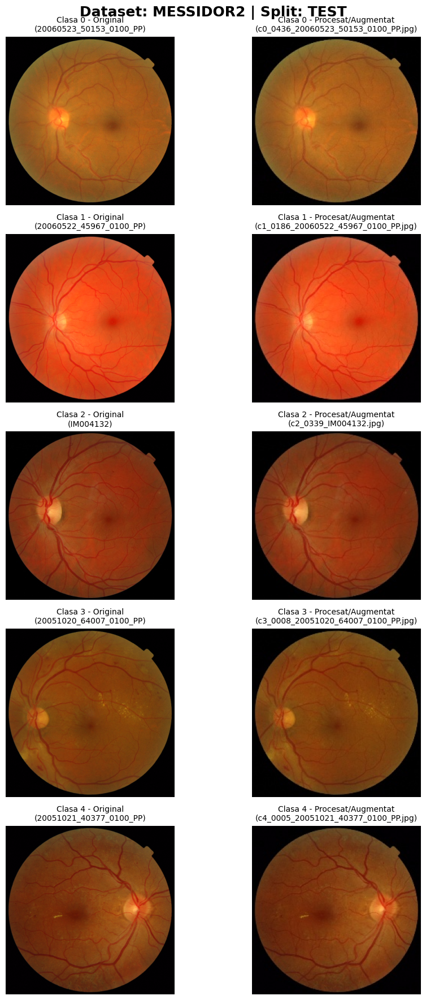

In [6]:
root_dir = r'B:\Projects\Disertatie\Diabetic-Retinopathy-Classifier'
augmented_dir = os.path.join(root_dir, 'datasets_augmented')

# Folosim aceleași căi originale pentru a putea găsi pozele "Before"
datasets_config = {
    'aptos': {
        'train': 'datasets/aptos2019/versions/3/train_images/train_images',
        'test':  'datasets/aptos2019/versions/3/test_images/test_images'
    },
    'eyepacs': {
        'train': 'datasets/resized-2015-2019-diabetic-retinopathy-detection/versions/4/resized_traintest15_train19',
        'test':  'datasets/resized-2015-2019-diabetic-retinopathy-detection/versions/4/resized_traintest15_train19'
    },
    'idrid': {
        'train': 'datasets/idrid-dataset/versions/1/Imagenes/Imagenes',
        'test':  'datasets/idrid-dataset/versions/1/Imagenes/Imagenes'
    },
    'messidor2': {
        'train': 'datasets/messidor2preprocess/versions/2/messidor-2/messidor-2/preprocess',
        'test':  'datasets/messidor2preprocess/versions/2/messidor-2/messidor-2/preprocess'
    }
}

for dataset_name, splits in datasets_config.items():
    for split_name, original_img_dir_rel in splits.items():
        
        sufix = 'balanced' if split_name == 'train' else 'processed'
        csv_nou = os.path.join(augmented_dir, dataset_name, split_name, f"{dataset_name}_{split_name}_{sufix}.csv")
        
        if not os.path.exists(csv_nou):
            continue
            
        df = pd.read_csv(csv_nou)
        original_img_dir = os.path.join(root_dir, original_img_dir_rel)
        augmented_img_dir = os.path.join(augmented_dir, dataset_name, split_name, 'images')

        # Setăm grid-ul: 5 rânduri (pentru cele 5 clase) x 2 coloane
        fig, axes = plt.subplots(5, 2, figsize=(10, 18))
        fig.suptitle(f"Dataset: {dataset_name.upper()} | Split: {split_name.upper()}", fontsize=18, fontweight='bold', y=0.98)

        for class_id in range(5):
            # Extragem o imagine random din clasa curentă
            df_class = df[df.iloc[:, 1] == class_id]
            if len(df_class) == 0:
                axes[class_id, 0].text(0.5, 0.5, 'Fără date', ha='center', va='center')
                axes[class_id, 1].text(0.5, 0.5, 'Fără date', ha='center', va='center')
                axes[class_id, 0].axis('off')
                axes[class_id, 1].axis('off')
                continue
                
            row = df_class.sample(1).iloc[0]
            aug_img_name = str(row['id_code'])
            
            # Parsăm numele original din numele augmentat (ex: c3_0015_numeOriginal.jpg -> numeOriginal)
            parti = aug_img_name.replace('.jpg', '').split('_')
            # Numele original este tot ce urmează după clasa și index (primele 2 elemente)
            nume_baza_original = "_".join(parti[2:]) 
            
            # Găsim pozele pe disc
            cale_aug = os.path.join(augmented_img_dir, aug_img_name)
            cale_orig = get_real_image_path(original_img_dir, nume_baza_original)

            # Încărcare și conversie BGR -> RGB (pentru Matplotlib)
            img_aug = cv2.imread(cale_aug)
            if img_aug is not None:
                img_aug = cv2.cvtColor(img_aug, cv2.COLOR_BGR2RGB)
            else:
                img_aug = None

            img_orig = cv2.imread(cale_orig) if cale_orig else None
            if img_orig is not None:
                img_orig = cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)

            # Plot Imagine Originală
            ax_orig = axes[class_id, 0]
            if img_orig is not None:
                ax_orig.imshow(img_orig)
                ax_orig.set_title(f"Clasa {class_id} - Original\n({nume_baza_original})", fontsize=10)
            else:
                ax_orig.text(0.5, 0.5, 'Imagine Originală\nNăgăsită', ha='center')
            ax_orig.axis('off')

            # Plot Imagine Procesată
            ax_aug = axes[class_id, 1]
            if img_aug is not None:
                ax_aug.imshow(img_aug)
                ax_aug.set_title(f"Clasa {class_id} - Procesat/Augmentat\n({aug_img_name})", fontsize=10)
            else:
                ax_aug.text(0.5, 0.5, 'Imagine Procesată\nNăgăsită', ha='center')
            ax_aug.axis('off')

        plt.tight_layout()
        
        # Salvăm graficul automat în folderul proiectului
        os.makedirs('Rezultate_Vizuale', exist_ok=True)
        nume_salvare = f"Rezultate_Vizuale/comparatie_{dataset_name}_{split_name}.png"
        plt.savefig(nume_salvare, dpi=150, bbox_inches='tight')
        
        plt.show() # Afișăm și în notebook